# Elo

In [1]:
from file import read, write
import pandas as pd

In [2]:
TEAMS = {}

for team in read('data/teams.json'):
    teamID = team["team_id"]
    TEAMS[teamID] = team

TEAMS

{'107582169874155554': {'team_id': '107582169874155554',
  'name': "God's Plan",
  'acronym': 'GDP',
  'slug': 'gods-plan'},
 '105550059790656435': {'team_id': '105550059790656435',
  'name': 'T1 Esports Academy',
  'acronym': 'T1',
  'slug': 't1-challengers'},
 '103535282143744679': {'team_id': '103535282143744679',
  'name': 'Dark Passage Akademi',
  'acronym': 'DP',
  'slug': 'dark-passage-akademi'},
 '109637393694097670': {'team_id': '109637393694097670',
  'name': 'Team Heretics',
  'acronym': 'TH',
  'slug': 'team-heretics-lec'},
 '101157821387445307': {'team_id': '101157821387445307',
  'name': 'Caps',
  'acronym': 'EU1',
  'slug': 'caps'},
 '110534724851488577': {'team_id': '110534724851488577',
  'name': 'Froggy Five',
  'acronym': 'FROG',
  'slug': 'froggy-five'},
 '109671201259007744': {'team_id': '109671201259007744',
  'name': 'Team Liquid Honda First',
  'acronym': 'TLF',
  'slug': 'team-liquid-honda-first'},
 '107423086908356081': {'team_id': '107423086908356081',
  'nam

In [3]:
elos = read('data/elos.json')

for team, elo in elos.items():
    print(team, elo[-1]["elo"])

110733889090164854 1494.0461776843383
109981650516317055 1525.1220984355862
110534732558665825 1492.190229697568
110733877357854829 1500.0007814573173
110534741480867943 1495.973682712273
107580497041999074 1508.5759189031307
110534728305628996 1494.1369968053195
110733870612047344 1505.9845394653694
110534714934488523 1492.4069600648954
107580483738977500 1500.0167899936152
110534700622694005 1484.2501623759308
110733864366329081 1505.7969611431693
109783149221216052 1503.853335895249
110733881542862348 1492.046049667289
110534696811298545 1498.370632292102
109981647134921596 1498.897407690611
105521706535388095 1570.4365368792724
105521637552587612 1505.1905529043174
102787200149928963 1558.5850636671491
105521674055625312 1483.692183105893
108078422885368642 1493.8029317131727
107067065368380132 1485.9911500956114
109671413728531527 1482.526617622507
105521293297166647 1452.1151568100192
105520786527322647 1533.575293924429
107179740624168899 1500.4711373729826
105520822049210915 14

In [4]:
def plot_elo(id, elo):
    elo.sort(key=lambda x: x["timestamp"])
    dates = pd.to_datetime([d['timestamp'] for d in elo], format='ISO8601')

    eloGraph = pd.DataFrame({
        'elo': [d['elo'] for d in elo],
    }, index=dates)

    eloGraph.plot(title="Elo: " + TEAMS[id]["name"], xlabel="Timestamp", figsize=(20, 5))

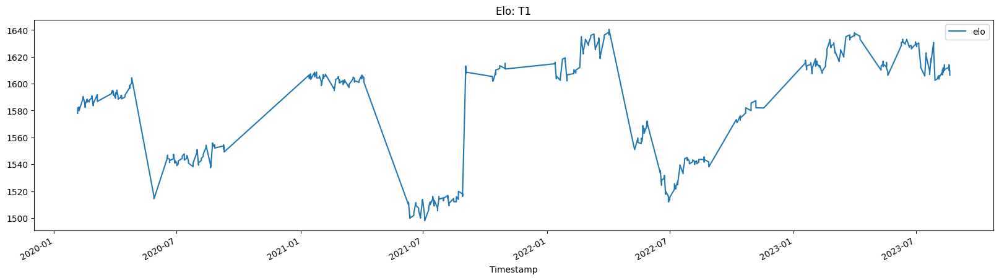

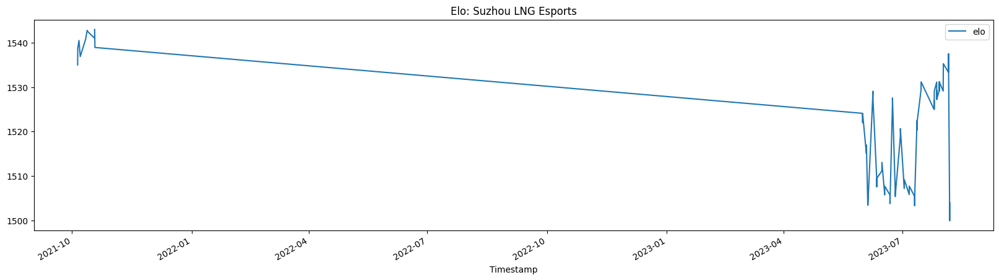

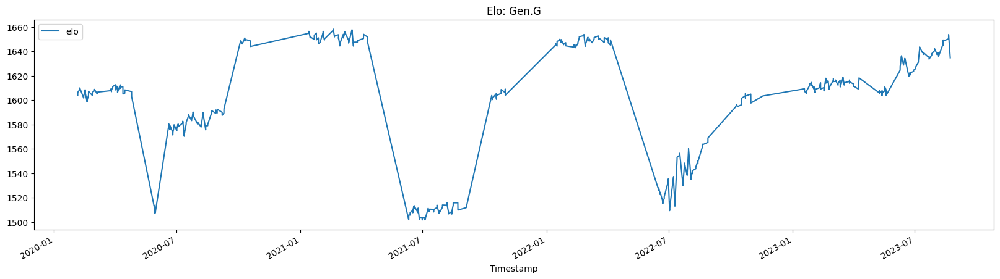

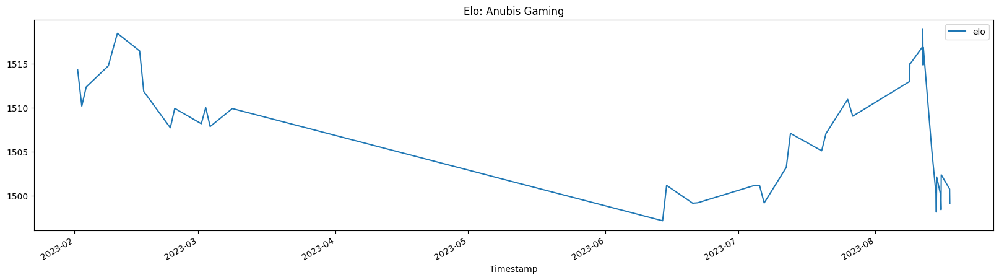

In [5]:
interesting = ["98767991853197861", "99566404850008779", "100205573495116443", "109696073114910519"]
# interesting = ["98767991853197861", "100205573495116443"]

for team in interesting:
    plot_elo(team, elos[team])

/opt/homebrew/lib/python3.11/site-packages/pandas/plotting/_matplotlib/core.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


KeyError: '108159940380634858'

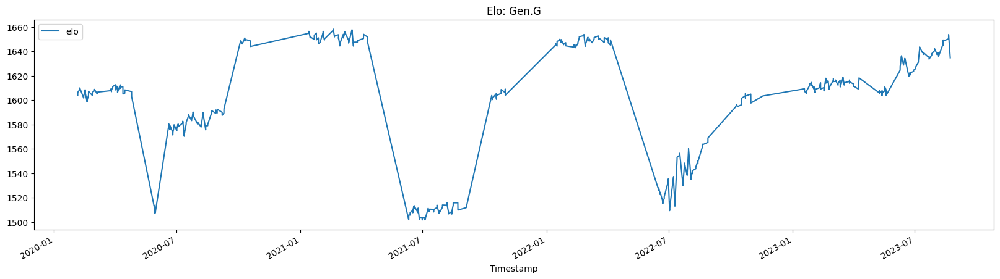

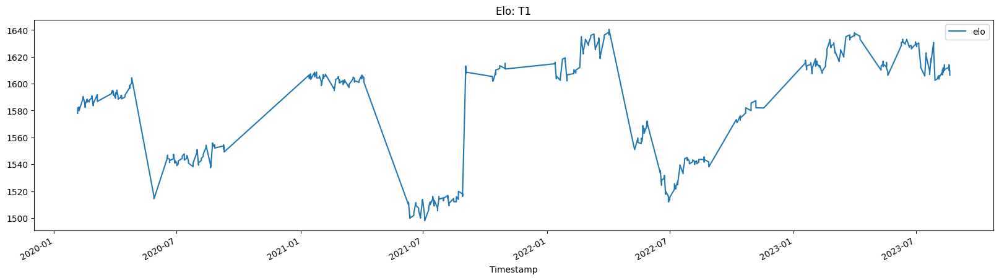

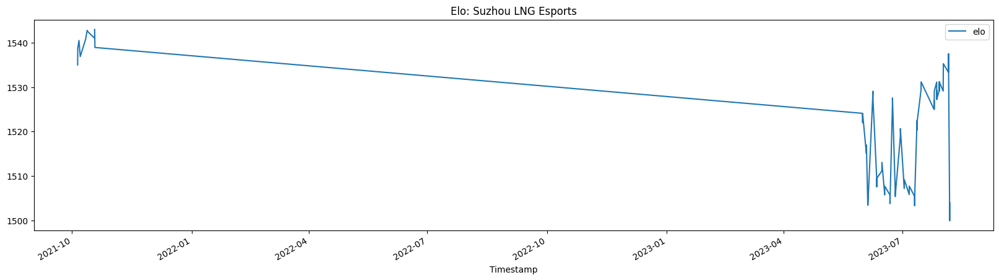

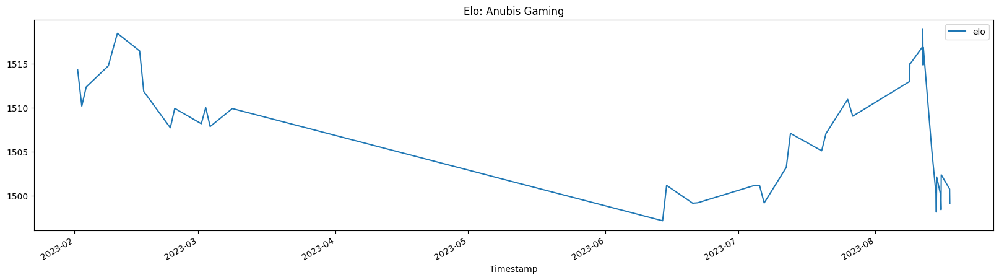

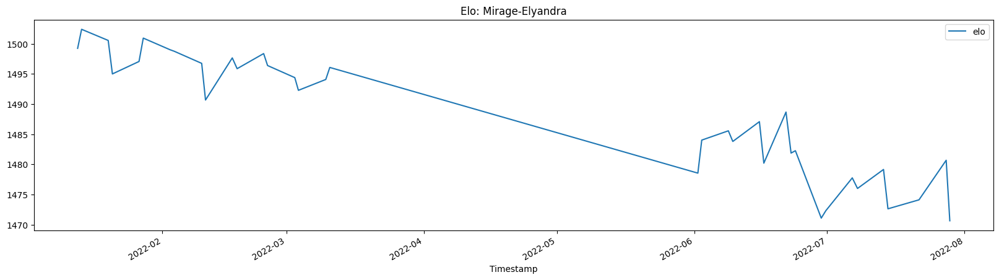

...

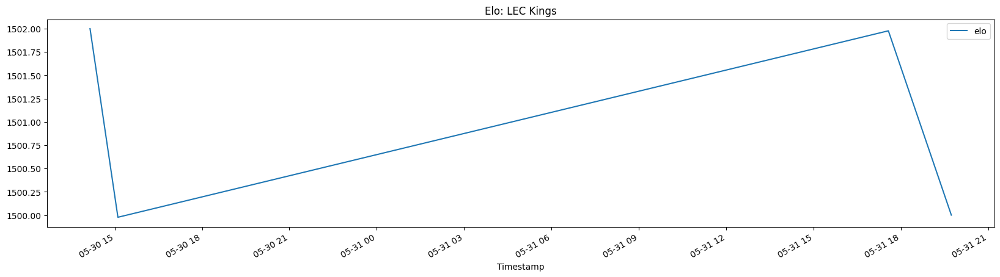

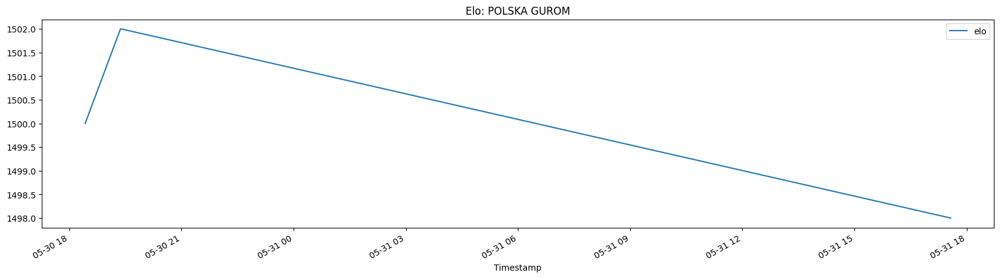

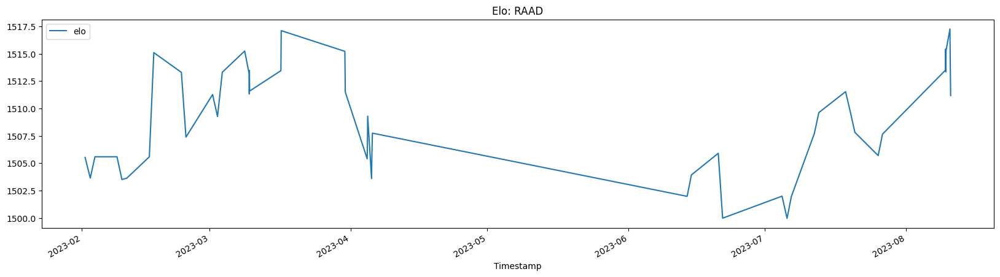

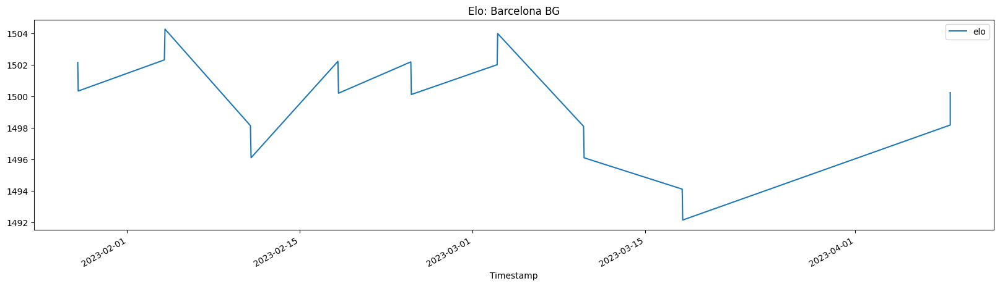

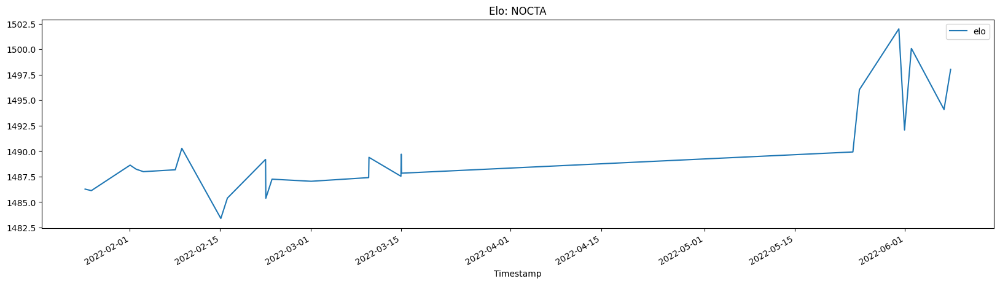

In [6]:
e = elos.copy()

a = []
for team, elo in e.items():
    a.append({"team_id": team, "name": TEAMS[team]['name'] if team in TEAMS else "UNKNOWN", "elo": elo[0]['elo']})

a.sort(key=lambda x: x["elo"], reverse=True)

for top in a:
    plot_elo(top['team_id'], elos[top['team_id']])